In [1]:
#Hyper parameter sonuçları


#inf --- > infl_year_value             1.{LGMRegressor}=0.40                 |hyperparameter=0.40{test r2 skoru küçük iyileşme}


#lendin -- > lending_year_value       1.{CatBoostRegressor}=0.86             |hyperparameter=0.86{test r2 skoru küçük iyileşme}|


#stock --> stock_marget_year_value    1.{GradientBoostingRegressor}= 0.39    |hyperparameter=0.39 {r2 skorunda küçük iyileşme}|


#gdp --> gdp_dollar_growth_rate       1.{CatBoostRegressor}= 0.18              |hyperparameter=0.20|     


#exchange --> exchange_growth_rate    1.{RandomForestRegressor} = 0.29          |hyperparameter=0.33|

In [2]:
!pip install hyperopt

In [3]:
#linear
import pandas as pd
import numpy as np


#Visual
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
sns.set_theme(style='dark')

#statiscial
from scipy.stats import norm
from scipy import stats


#Models
from lightgbm import LGBMRegressor
from sklearn.linear_model import LinearRegression
from catboost import CatBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor,GradientBoostingRegressor,ExtraTreesRegressor,RandomForestRegressor



#hyperparamater
from hyperopt import fmin, hp, tpe, Trials, space_eval, STATUS_OK


#model selection
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder,StandardScaler

from sklearn.model_selection import train_test_split,KFold,cross_val_score,GridSearchCV,RandomizedSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error,explained_variance_score,max_error,median_absolute_error,accuracy_score,median_absolute_error,roc_auc_score,make_scorer

#model save
import joblib


import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter("ignore")

In [4]:
df = pd.read_csv('all_data_merged_v0.csv')
df = df.replace([np.inf],np.NaN)

In [5]:
def show_outlier(df,column,outlier_type):
    fig = px.box(df, y=df[column],points='outliers')
    fig.update_layout(title_text=f"{column} Before Outliers", title_x=0.5,)
    fig.show()
    df_ = df.copy()
    if outlier_type == 1:
        df_ = df_.drop(df_.loc[df_[column] > (df_[column].median() + 100)].index)
        fig = px.box(df_, y=df_[column],points='outliers')
        fig.update_layout(title_text=f"{column} After Outliers", title_x=0.5,)
        fig.show()
    if outlier_type == 2:
        df_ = df_.drop(df_.loc[df_[column] > (df_[column].median() * 2 )].index)
        fig = px.box(df_, y=df_[column],points='outliers')
        fig.update_layout(title_text=f"{column} After Outliers", title_x=0.5)
        fig.show()
show_outlier(df,"exchange_growth_rate",1)

In [6]:
def outlier_median100(df,columns):
    for col in columns:
        df = df.drop(df.loc[df[col] > (df[col].median() + 100)].index)
    return df
df = outlier_median100(df,["exchange_growth_rate",'stock_marget_year_value','gdp_dollar_growth_rate'])

def outlier_median_plus2(df,columns):
    for col in columns:
        df = df.drop(df.loc[df[col] > (df[col].median() *2)].index)
    return df
df = outlier_median_plus2(df,["infl_year_value","lending_year_value"])  

lags = ["exchange_growth_rate","infl_year_value","lending_year_value","stock_marget_year_value","gdp_dollar_growth_rate"]
for lag in lags:
    df[f"{lag}_1_lag"] = df.groupby('country')[lag].shift()

In [7]:
plt.figure(figsize=(18,10),dpi=800)
df_corr = df.corr()
mask = np.triu(np.ones_like(df_corr, dtype=bool))
sns.heatmap(df_corr, linewidths=0.02,square=True,annot=True,fmt=".2f",annot_kws={'size':8},cmap='coolwarm')
plt.title("Correlation",fontsize=15)
plt.show()

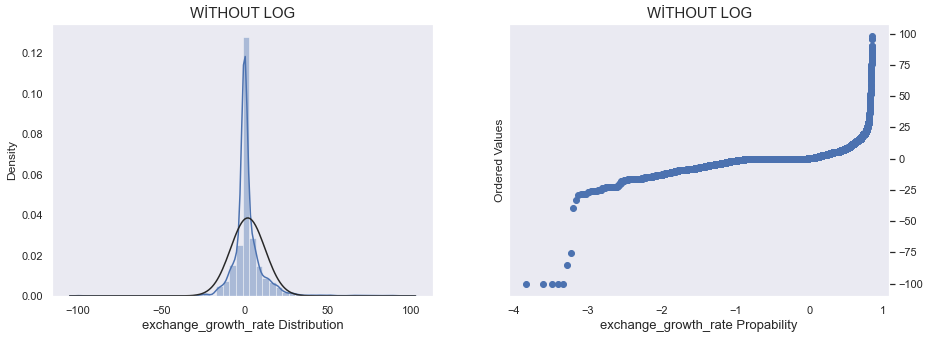

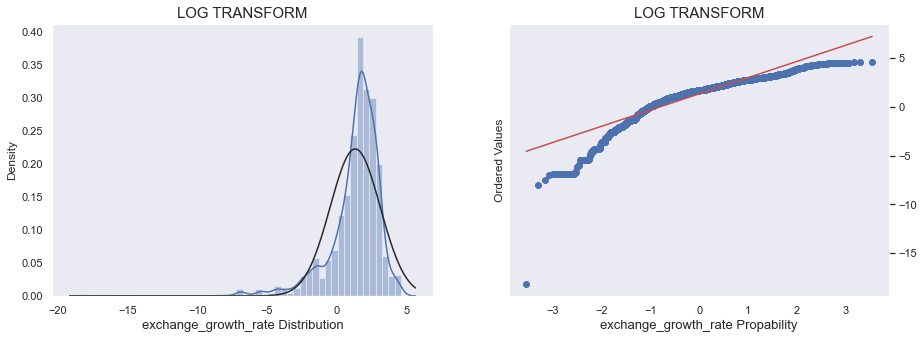

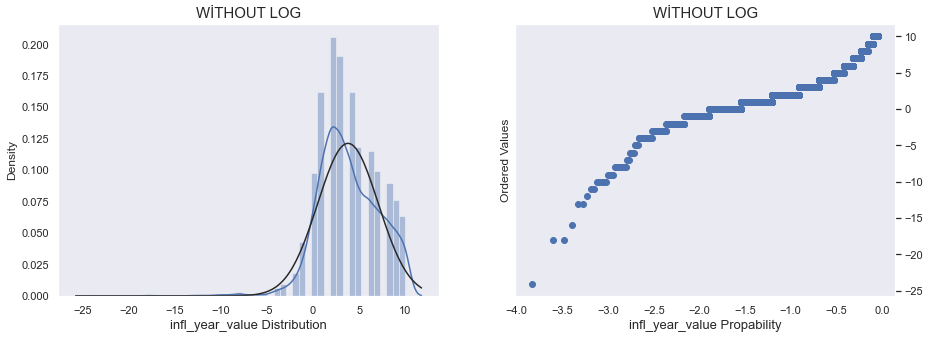

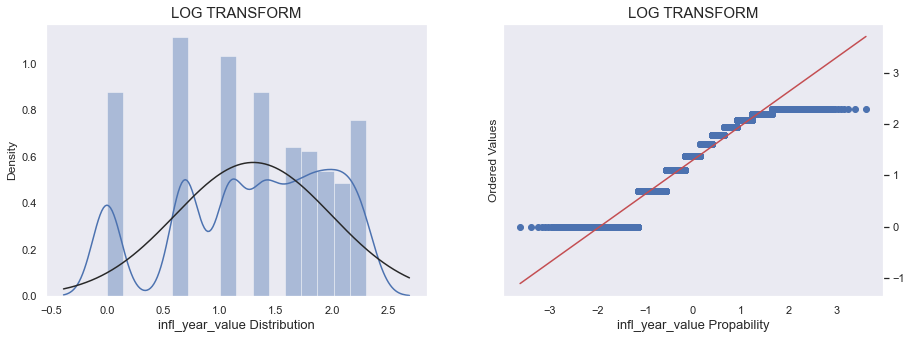

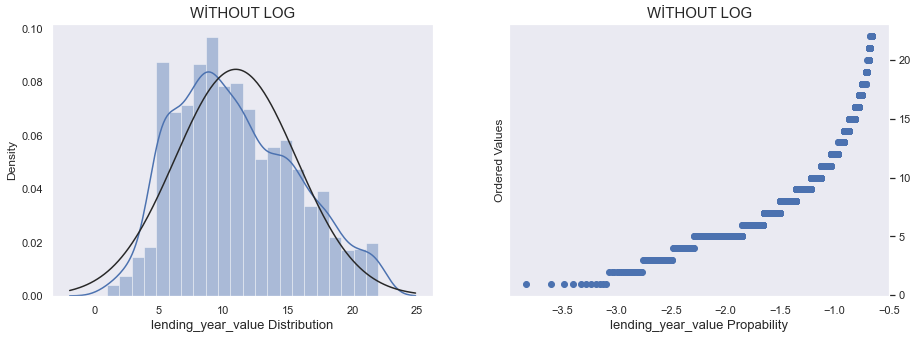

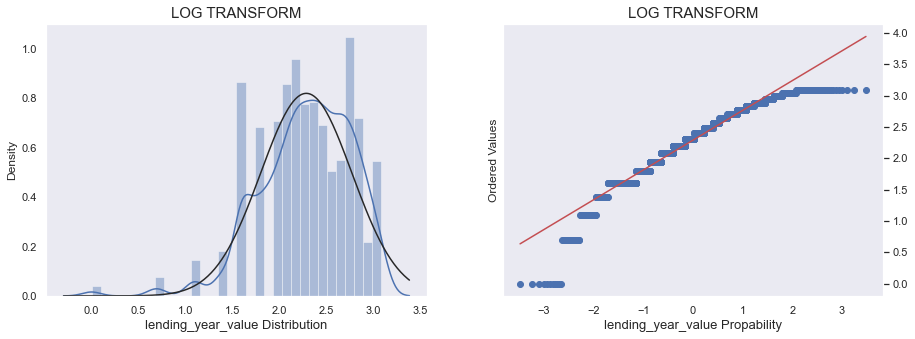

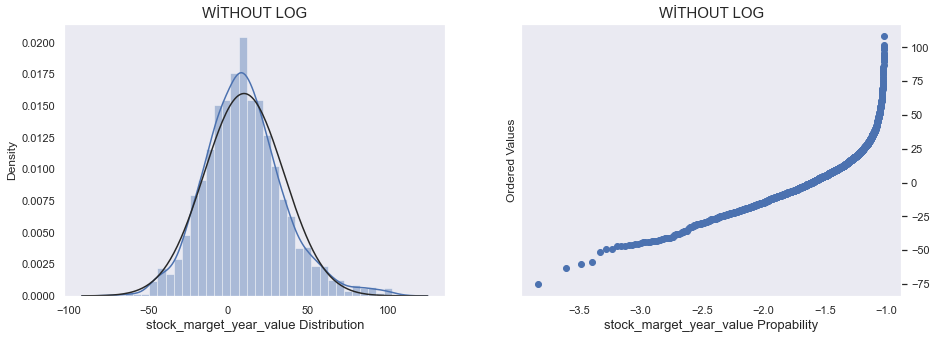

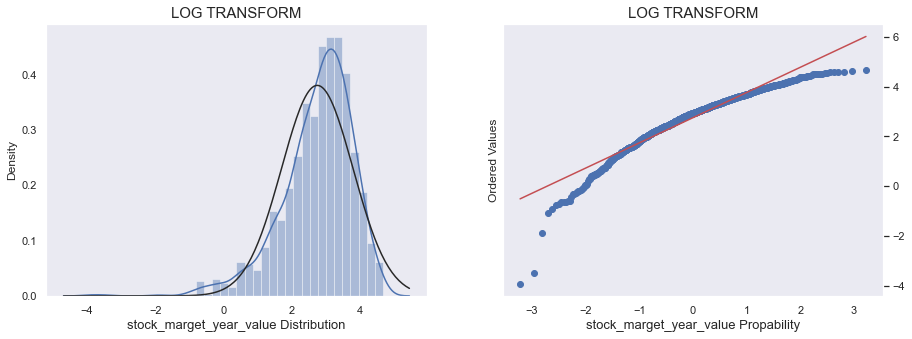

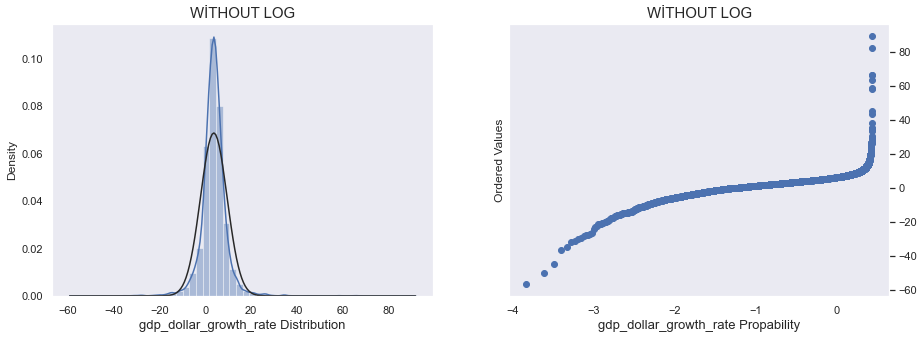

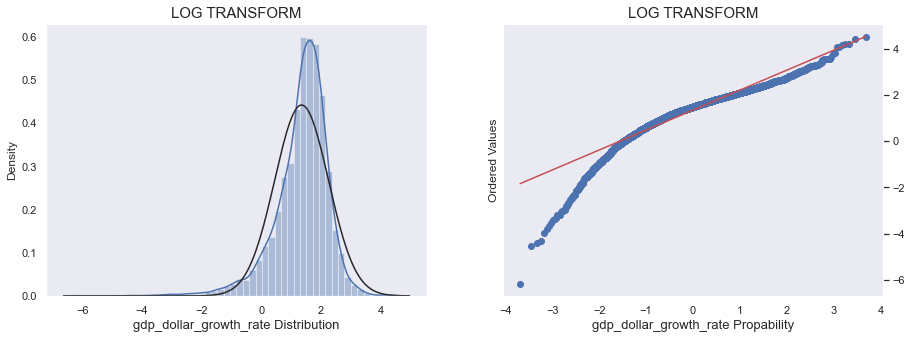

In [8]:
def show_details(df,column):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    sns.distplot(df[column], fit=norm, ax=ax[0])
    stats.probplot(df[column], plot=plt)
    ax[0].set_xlabel(f'{column} Distribution', fontsize = 13)
    ax[1].set_xlabel(f'{column} Propability', fontsize = 13)
    ax[1].set_title('WİTHOUT LOG', fontsize = 15, loc='center')
    ax[1].yaxis.tick_right()
    ax[0].set_title('WİTHOUT LOG', fontsize = 15, loc='center')
    df_ = df.copy()
    with np.errstate(divide="ignore"):
        df_ = df_[df_[column]>0].copy()
        df_[column] = np.log(df_[column])
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
        sns.distplot(df_[column], fit=norm, ax=ax[0])
        stats.probplot(df_[column], plot=plt)
        ax[0].set_xlabel(f'{column} Distribution', fontsize = 13)
        ax[0].set_title('LOG TRANSFORM', fontsize = 15, loc='center')
        ax[1].set_xlabel(f'{column} Propability', fontsize = 13)
        ax[1].set_title('LOG TRANSFORM', fontsize = 15, loc='center')
        ax[1].yaxis.tick_right()
    
y_variables = ["exchange_growth_rate","infl_year_value","lending_year_value","stock_marget_year_value","gdp_dollar_growth_rate"]    
for variable in y_variables:
    show_details(df,variable)

In [9]:
inf = ["usa_gdp_dollar_growth_rate","usa_stock_marget_year_value",
       "usa_lending_year_value","usa_infl_year_value","gdp_dollar_growth_rate_1_lag",
       "gdp_dollar_growth_rate","exchange_growth_rate_1_lag","infl_year_value_1_lag",
       "exchange_growth_rate","Currency_Crisis_dummy","Sovereign_Crisis_dummy",
       "Banking_Crisis_dummy","Covid_dummy","infl_year_value","country"]
#-----------------------------------------------------------------------------------------------
lendin = ["usa_gdp_dollar_growth_rate","usa_stock_marget_year_value","usa_lending_year_value",
       "usa_infl_year_value","gdp_dollar_growth_rate_1_lag","gdp_dollar_growth_rate",
       "exchange_growth_rate_1_lag","infl_year_value_1_lag","exchange_growth_rate",
       "infl_year_value","lending_year_value_1_lag","Currency_Crisis_dummy",
       "Sovereign_Crisis_dummy","Banking_Crisis_dummy","Covid_dummy","lending_year_value","country"]
#-----------------------------------------------------------------------------------------------
stock = ["usa_gdp_dollar_growth_rate","usa_stock_marget_year_value","usa_lending_year_value",
 "usa_infl_year_value","gdp_dollar_growth_rate_1_lag","gdp_dollar_growth_rate",
 "exchange_growth_rate_1_lag","infl_year_value_1_lag","exchange_growth_rate",
 "infl_year_value","stock_marget_year_value_1_lag","Currency_Crisis_dummy",
 "Sovereign_Crisis_dummy","Banking_Crisis_dummy","Covid_dummy","stock_marget_year_value","country"]
#-----------------------------------------------------------------------------------------------
gdp = ["usa_gdp_dollar_growth_rate","usa_stock_marget_year_value","usa_lending_year_value",
 "usa_infl_year_value","gdp_dollar_growth_rate_1_lag","exchange_growth_rate_1_lag",
 "infl_year_value_1_lag","Currency_Crisis_dummy","Sovereign_Crisis_dummy","Banking_Crisis_dummy",
 "Covid_dummy","gdp_dollar_growth_rate","country"]

exchange = ["usa_gdp_dollar_growth_rate","usa_stock_marget_year_value","usa_lending_year_value",
"usa_infl_year_value","gdp_dollar_growth_rate_1_lag","gdp_dollar_growth_rate",
"exchange_growth_rate_1_lag","infl_year_value_1_lag","Currency_Crisis_dummy",
"Sovereign_Crisis_dummy","Banking_Crisis_dummy","Covid_dummy","exchange_growth_rate","country"]

# Not
### - **Herhangi bir model için ortalama ile doldurmak yanlış sonuçlar vermektedir. Model aşırı öğrenerek lag değerleri üzerinden simple öğrenme gerçekleştiriyor. Çözüm olarak boş değerlere -9999 atamak yanlılığı azaltıyor ve modelin genellemesi artmaktadır.** 

### * Farklı veri setlerinin country label farklılık gösteriyor.

# Farklı Modellerin denenmesi

In [10]:
#Makine öğrenmesi modellerin aşağıda belirtilen {x y} değişkenlerin test adj r2 skor bazında en iyi iki model ve sonuçlar

#inf --- > infl_year_value             1.{LGMRegressor}=0.40                       2.{CatBoostRegressor}= 0.39


#lendin -- > lending_year_value       1.{CatBoostRegressor}=0.86                  2.{LGBMRegressor}= 0.84


#stock --> stock_marget_year_value    1.{GradientBoostingRegressor}= 0.39   2.{CatBoostRegressor}= 0.38  


#gdp --> gdp_dollar_growth_rate       1.{CatBoostRegressor}= 0.18           2.{GradientBoostingRegressor}= 0.14


#exchange --> exchange_growth_rate    1.{RandomForestRegressor} = 0.29            2.{LGBMRegressor}= 0.25

In [11]:
models = []
models.append(('LGBMRegressor', LGBMRegressor()))
models.append(('LinearRegression', LinearRegression()))
models.append(('CatBoostRegressor', CatBoostRegressor(logging_level='Silent',cat_features=['country'])))
models.append(('DecisionTreeRegressor', DecisionTreeRegressor()))
models.append(('AdaBoostRegressor', AdaBoostRegressor()))
models.append(('GradientBoostingRegressor', GradientBoostingRegressor()))
models.append(('RandomForestRegressor',RandomForestRegressor()))

############################################################
Test set evaluation    ----  LGBMRegressor'>  -----

MAE: 4.1489476430538685
MSE: 66.95875686801458
Explained_variance_score: 0.2645581720675715
RMSE: 8.18283305878927
Test R2 Score: 0.262329401966527
Test Adjusted R2 0.2578897178116959
 
############################################################
Train set evaluation    ----  LGBMRegressor'>  -----

MAE: 2.9100526128697477
MSE: 26.619323907021922
Explained_variance_score: 0.7636116813146165
RMSE: 5.159391815613728
Train R2 Score: 0.7636116812392977
Train Adjusted R2 0.7631394131981283


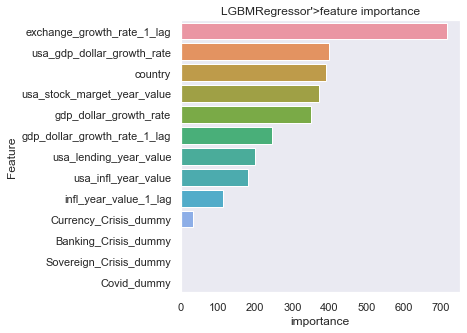

____________________________________________________________
############################################################
Test set evaluation    ----  LinearRegression'>  -----

MAE: 5.264563458733992
MSE: 85.67091266852673
Explained_variance_score: 0.058206524928209435
RMSE: 9.255858289133792
Test R2 Score: 0.0561815012958522
Test Adjusted R2 0.050501112183280794
 
############################################################
Train set evaluation    ----  LinearRegression'>  -----

MAE: 5.665501205968771
MSE: 102.40635171933398
Explained_variance_score: 0.09059804081031664
RMSE: 10.119602349862072
Train R2 Score: 0.09059804081031664
Train Adjusted R2 0.08878119349673652
____________________________________________________________
############################################################
Test set evaluation    ----  CatBoostRegressor'>  -----

MAE: 3.990676199623627
MSE: 68.98362097322905
Explained_variance_score: 0.2431460491265599
RMSE: 8.305637902848224
Test R2 Score: 0.2400218982

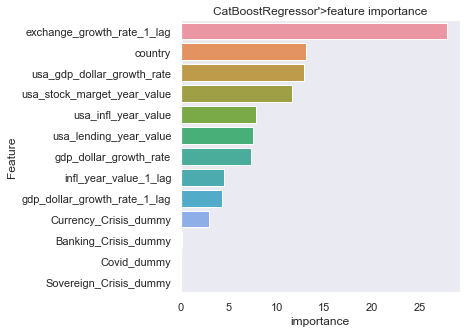

____________________________________________________________
############################################################
Test set evaluation    ----  DecisionTreeRegressor'>  -----

MAE: 4.713200315036851
MSE: 140.70064958867349
Explained_variance_score: -0.550013202424821
RMSE: 11.861730463497874
Test R2 Score: -0.5500695828383062
Test Adjusted R2 -0.5593987053276108
 
############################################################
Train set evaluation    ----  DecisionTreeRegressor'>  -----

MAE: 3.525834608337999e-10
MSE: 9.012147938407611e-17
Explained_variance_score: 1.0
RMSE: 9.493233347183462e-09
Train R2 Score: 1.0
Train Adjusted R2 1.0


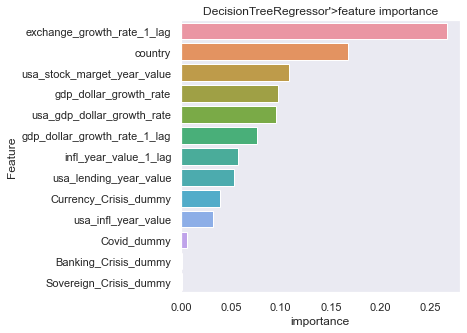

____________________________________________________________
############################################################
Test set evaluation    ----  AdaBoostRegressor'>  -----

MAE: 13.915006663590859
MSE: 311.4603691027279
Explained_variance_score: -1.0110935461861974
RMSE: 17.64823983015666
Test R2 Score: -2.431293642332941
Test Adjusted R2 -2.451944946661797
 
############################################################
Train set evaluation    ----  AdaBoostRegressor'>  -----

MAE: 13.580176643323336
MSE: 284.966663747037
Explained_variance_score: -0.5209209677355506
RMSE: 16.880955652658916
Train R2 Score: -1.5305973503045576
Train Adjusted R2 -1.53565310035127


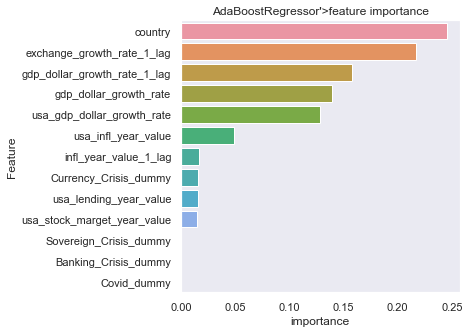

____________________________________________________________
############################################################
Test set evaluation    ----  GradientBoostingRegressor'>  -----

MAE: 4.413902301325089
MSE: 76.02491183287809
Explained_variance_score: 0.16484447599241414
RMSE: 8.719226561621053
Test R2 Score: 0.16244947187795455
Test Adjusted R2 0.15740865851425712
 
############################################################
Train set evaluation    ----  GradientBoostingRegressor'>  -----

MAE: 4.255534105659189
MSE: 58.92439750795603
Explained_variance_score: 0.47673204212302733
RMSE: 7.67622286726721
Train R2 Score: 0.47673204212302733
Train Adjusted R2 0.4756866320335237


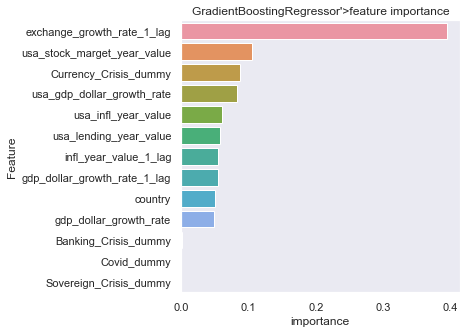

____________________________________________________________
############################################################
Test set evaluation    ----  RandomForestRegressor'>  -----

MAE: 3.477987555031896
MSE: 65.0353133549363
Explained_variance_score: 0.2847163054315901
RMSE: 8.064447492230098
Test R2 Score: 0.2835195762311544
Test Adjusted R2 0.27920742553254563
 
############################################################
Train set evaluation    ----  RandomForestRegressor'>  -----

MAE: 1.4265244587997277
MSE: 10.680294862496599
Explained_variance_score: 0.9051594966492927
RMSE: 3.2680720405916084
Train R2 Score: 0.9051554819636818
Train Adjusted R2 0.9049659969883518


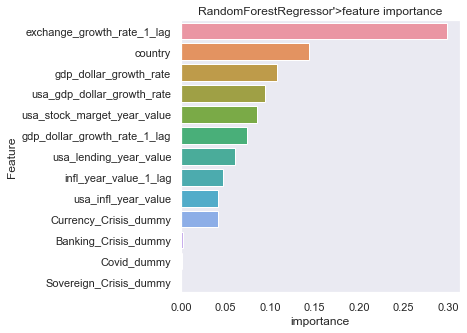

____________________________________________________________


In [12]:
def test(df,X_variables,y_variables,model):
    dataframe = df[X_variables]
    
    dataframe = dataframe.dropna(subset=y_variables).reset_index(drop=True)
    dataframe = dataframe.replace(np.NaN,-9999)
    
    label_encoder = LabelEncoder()
    dataframe['country'] = label_encoder.fit_transform(dataframe['country'])
    dataframe['country'] = dataframe['country'].astype('category')
    
    dataframe = dataframe.replace(np.NaN,-9999)
    
    X = dataframe.drop(y_variables,axis=1)
    y = dataframe[y_variables]
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, 
                                test_size=0.25, random_state=1)
    model = model.fit(x_train, y_train)
    model_name = str(model.__class__).split('.')[-1]
    #model.fit(x_train, y_train)
    
    train_pred = model.predict(x_train)
    test_pred = model.predict(x_test)
    
    #-------------------train---------------------------------------
    
    train_r2 = r2_score(y_train,train_pred)
    #print("Train R2 Score:",train_r2)
    
    # n is number of rows in X
    n1 = x_train.shape[0]
    
    #Number of features (predictors, p) is the shape along axis 1
    p1 = x_train.shape[1]
    
    adjusted_r2_train = 1-(1-train_r2)*(n1-1)/(n1-p1-1)
    #print("Train Adjusted R2",adjusted_r2_train)
    
    #--------------------test-------------------------------------------
    test_r2 = r2_score(y_test,test_pred)
    #print("Test R2 Score:",test_r2)
    
    # n is number of rows in X
    n = x_test.shape[0]
    
    # Number of features (predictors, p) is the shape along axis 1
    p = x_test.shape[1]
    
    #We find the Adjusted R-squared using the formula
    adjusted_r2_test = 1-(1-test_r2)*(n-1)/(n-p-1)
    #print("Test Adjusted R2",adjusted_r2_test)
    
    
    def print_evaluate(true, predicted):  
        mae = metrics.mean_absolute_error(true, predicted)
        mse = metrics.mean_squared_error(true, predicted)
        Explained_variance_score = metrics.explained_variance_score(true, predicted)
        rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
        print('MAE:', mae)
        print('MSE:', mse)
        print("Explained_variance_score:",Explained_variance_score)
        print('RMSE:', rmse)
    print('#'*60)
    print(f'Test set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_test, test_pred)
    print("Test R2 Score:",test_r2)
    print("Test Adjusted R2",adjusted_r2_test)
    print(" ")
    print('#'*60)
    print(f'Train set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_train, train_pred)
    print("Train R2 Score:",train_r2)
    print("Train Adjusted R2",adjusted_r2_train)
    try:
        plot_importances = pd.DataFrame({'Feature':X.columns,
          "importance":model.feature_importances_}).sort_values(by='importance',ascending=False)
        plt.figure(figsize=(5,5))
        sns.barplot(x=plot_importances['importance'], y=plot_importances['Feature'])
        plt.title(model_name +'feature importance')
        plt.show()
    except AttributeError:
        pass    
    print('____________________________________________________________')
    
for model in models:
    test(df,exchange,"exchange_growth_rate",model[1]) # girilen x ve y değeri için bütün modeller çalışır

# RandomForest Hyper Parameter

In [13]:
def randomforest_hyper_for_exchange(df,X_variables,y_variables):
    
    dataframe = df[X_variables]
    dataframe = dataframe.dropna(subset=y_variables).reset_index(drop=True)
    
    dataframe = dataframe.replace(np.NaN,-9999)
    
    label_encoder = LabelEncoder()
    dataframe["country"] = label_encoder.fit_transform(dataframe["country"])
    dataframe['country'] = dataframe['country'].astype('category')
    
    
    X = dataframe.drop(y_variables,axis=1)
    y = dataframe[y_variables]
    x_train, x_test, y_train, y_test = train_test_split(X, y, 
                            test_size=0.25, random_state=1)
    
    forest = RandomForestRegressor(random_state=1,n_jobs=-1)
    
    # Number of trees in random forest
    n_estimators = [int(x) for x in np.linspace(start = 200, stop = 500, num = 10)]
    # Number of features to consider at every split
    max_features = ['auto', 'sqrt']
    # Maximum number of levels in tree
    max_depth = [int(x) for x in np.linspace(10, 80, num = 11)]
    max_depth.append(None)
    # Minimum number of samples required to split a node
    min_samples_split = [2, 5, 10]
    # Minimum number of samples required at each leaf node
    min_samples_leaf = [1, 2, 4]
    # Method of selecting samples for training each tree
    bootstrap = [True, False]
    # Create the random grid
    
    random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
    
    grid_forest = RandomizedSearchCV(estimator=forest,
                                     param_distributions = random_grid,
                                     cv = 5,n_iter = 100,
                                     n_jobs=-1,verbose=True,scoring = "r2")
    
    grid_forest.fit(x_train, y_train)
    
    best_params = grid_forest.best_params_
    final_model = RandomForestRegressor(**best_params,random_state=1,n_jobs=-1)
    final_model.fit(x_train, y_train)
    
    model_name = "Random_Forest"
    
    #model save
    print("Kaydedilen Model ismi:",joblib.dump(final_model, f"{y_variables}_{model_name}.joblib"))
    
    train_pred = final_model.predict(x_train)
    test_pred = final_model.predict(x_test)
    #-------------------train---------------------------------------
    train_r2 = r2_score(y_train,train_pred)
    #print("Train R2 Score:",train_r2)
    # n is number of rows in X
    n1 = x_train.shape[0]
    #Number of features (predictors, p) is the shape along axis 1
    p1 = x_train.shape[1]
    adjusted_r2_train = 1-(1-train_r2)*(n1-1)/(n1-p1-1)
    #print("Train Adjusted R2",adjusted_r2_train)
    #--------------------test-------------------------------------------
    test_r2 = r2_score(y_test,test_pred)
    #print("Test R2 Score:",test_r2)
    # n is number of rows in X
    n = x_test.shape[0]
    # Number of features (predictors, p) is the shape along axis 1
    p = x_test.shape[1]
    #We find the Adjusted R-squared using the formula
    adjusted_r2_test = 1-(1-test_r2)*(n-1)/(n-p-1)
    #print("Test Adjusted R2",adjusted_r2_test)
    def print_evaluate(true, predicted):  
        mae = metrics.mean_absolute_error(true, predicted)
        mse = metrics.mean_squared_error(true, predicted)
        Explained_variance_score = metrics.explained_variance_score(true, predicted)
        rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
        print('MAE:', mae)
        print('MSE:', mse)
        print("Explained_variance_score:",Explained_variance_score)
        print('RMSE:', rmse)
    print('#'*60)
    print(f'Test set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_test, test_pred)
    print("Test R2 Score:",test_r2)
    print("Test Adjusted R2",adjusted_r2_test)
    print(" ")
    print('#'*60)
    print(f'Train set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_train, train_pred)
    print("Train R2 Score:",train_r2)
    print("Train Adjusted R2",adjusted_r2_train)
    try:
        plot_importances = pd.DataFrame({'Feature':X.columns,
          "importance":final_model.feature_importances_}).sort_values(by='importance',ascending=False)
        plt.figure(figsize=(5,5))
        sns.barplot(x=plot_importances['importance'], y=plot_importances['Feature'])
        plt.title(model_name +'feature importance')
        plt.show()
    except AttributeError:
        pass    
    print('____________________________________________________________')
#randomforest_hyper_for_exchange(df,exchange,"exchange_growth_rate")

# Catboost HyperParameter Tunning

In [14]:
def catboost_hyper_for_gdp(df,X_variables,y_variables):
    
    dataframe = df[X_variables]
    dataframe = dataframe.dropna(subset=y_variables).reset_index(drop=True)
    
    dataframe['country'] = dataframe['country'].astype('category')
    dataframe = dataframe.replace(np.NaN,-9999)
    
    X = dataframe.drop(y_variables,axis=1)
    y = dataframe[y_variables]
    
    x_train, x_test, y_train, y_test = train_test_split(X, y, 
                            test_size=0.25, random_state=1)
    # define the objective function which for this model is the RMSE
    def objective(search_space):
        model = CatBoostRegressor(**search_space,
                                  loss_function='RMSE',
                                  eval_metric='RMSE',
                                  early_stopping_rounds=100,
                                  random_seed=42,
                                 cat_features=['country'])
        
        model.fit(x_train, y_train, eval_set=(x_test,y_test), verbose=False)
        return {'loss': model.get_best_score()['validation']['RMSE'], 'status': STATUS_OK}
    
    # define the search space for the hyperparameters
    search_space = {'learning_rate': hp.uniform('learning_rate', 0.1, 0.5),
                'iterations': hp.randint('iterations',100,1000),
                'l2_leaf_reg': hp.randint('l2_leaf_reg',1,10),
                'depth': hp.randint('depth',4,10),
                'bootstrap_type' : hp.choice('bootstrap_type', ['Bayesian', 'Bernoulli'])}
    # bayesian algorithm
    algorithm=tpe.suggest
    
    # search for best parameters
    best_params = fmin(
      fn=objective,
      space=search_space,
      algo=algorithm,
      max_evals=10)
    
    # dict of the best params
    hyperparams = space_eval(search_space, best_params)
    
    params = {'learning_rate' : hyperparams['learning_rate'],
          'iterations' : hyperparams['iterations'],
          'depth' : hyperparams['depth'],
          'loss_function' : 'RMSE',
          'l2_leaf_reg' : hyperparams['l2_leaf_reg'],
          'eval_metric' : 'RMSE',
          'early_stopping_rounds': 150,
          'bootstrap_type' : hyperparams['bootstrap_type']}
    
    model_hyper = CatBoostRegressor(**params, random_seed=42,cat_features=['country'])
    model_hyper.fit(X = x_train, y = y_train, eval_set=(x_test,y_test),verbose=250)
    
    model_name = "CatBoostRegressor"
    
    #model save
    print("Kaydedilen Model ismi:",joblib.dump(model_hyper, f"{y_variables}_{model_name}.joblib"))
    
    train_pred = model_hyper.predict(x_train)
    test_pred = model_hyper.predict(x_test)
    
    #-------------------train---------------------------------------
    train_r2 = r2_score(y_train,train_pred)
    #print("Train R2 Score:",train_r2)
    # n is number of rows in X
    n1 = x_train.shape[0]
    #Number of features (predictors, p) is the shape along axis 1
    p1 = x_train.shape[1]
    adjusted_r2_train = 1-(1-train_r2)*(n1-1)/(n1-p1-1)
    #print("Train Adjusted R2",adjusted_r2_train)
    #--------------------test-------------------------------------------
    test_r2 = r2_score(y_test,test_pred)
    #print("Test R2 Score:",test_r2)
    # n is number of rows in X
    n = x_test.shape[0]
    # Number of features (predictors, p) is the shape along axis 1
    p = x_test.shape[1]
    #We find the Adjusted R-squared using the formula
    adjusted_r2_test = 1-(1-test_r2)*(n-1)/(n-p-1)
    #print("Test Adjusted R2",adjusted_r2_test)
    def print_evaluate(true, predicted):  
        mae = metrics.mean_absolute_error(true, predicted)
        mse = metrics.mean_squared_error(true, predicted)
        Explained_variance_score = metrics.explained_variance_score(true, predicted)
        rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
        print('MAE:', mae)
        print('MSE:', mse)
        print("Explained_variance_score:",Explained_variance_score)
        print('RMSE:', rmse)
    print('#'*60)
    print(f'Test set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_test, test_pred)
    print("Test R2 Score:",test_r2)
    print("Test Adjusted R2",adjusted_r2_test)
    print(" ")
    print('#'*60)
    print(f'Train set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_train, train_pred)
    print("Train R2 Score:",train_r2)
    print("Train Adjusted R2",adjusted_r2_train)
    try:
        plot_importances = pd.DataFrame({'Feature':X.columns,
          "importance":model_hyper.feature_importances_}).sort_values(by='importance',ascending=False)
        plt.figure(figsize=(5,5))
        sns.barplot(x=plot_importances['importance'], y=plot_importances['Feature'])
        plt.title(model_name +'feature importance')
        plt.show()
    except AttributeError:
        pass    
    print('____________________________________________________________')                
#catboost_hyper_for_gdp(df,gdp,"gdp_dollar_growth_rate")

# Gradient Boosting Hyper Parameter

In [15]:
def gradientboost_hyper_for_stock(df,X_variables,y_variables):
    
    dataframe = df[X_variables]
    dataframe = dataframe.dropna(subset=y_variables).reset_index(drop=True)
    dataframe = dataframe.replace(np.NaN,-9999)
    
    label_encoder = LabelEncoder()
    dataframe["country"] = label_encoder.fit_transform(dataframe["country"])
    dataframe['country'] = dataframe['country'].astype('category')
    
    X = dataframe.drop(y_variables,axis=1)
    y = dataframe[y_variables]
    x_train, x_test, y_train, y_test = train_test_split(X, y, 
                            test_size=0.25, random_state=1)
    
    final_model = GradientBoostingRegressor(random_state=1)
    
    final_model.fit(x_train, y_train)
    model_name = "Gradient_Boosting"
    
    #model save
    print("Kaydedilen Model ismi:",joblib.dump(final_model, f"{y_variables}_{model_name}.joblib"))
    train_pred = final_model.predict(x_train)
    test_pred = final_model.predict(x_test)
    
    #-------------------train---------------------------------------
    train_r2 = r2_score(y_train,train_pred)
    #print("Train R2 Score:",train_r2)
    # n is number of rows in X
    n1 = x_train.shape[0]
    #Number of features (predictors, p) is the shape along axis 1
    p1 = x_train.shape[1]
    adjusted_r2_train = 1-(1-train_r2)*(n1-1)/(n1-p1-1)
    #print("Train Adjusted R2",adjusted_r2_train)
    #--------------------test-------------------------------------------
    test_r2 = r2_score(y_test,test_pred)
    #print("Test R2 Score:",test_r2)
    # n is number of rows in X
    n = x_test.shape[0]
    # Number of features (predictors, p) is the shape along axis 1
    p = x_test.shape[1]
    #We find the Adjusted R-squared using the formula
    adjusted_r2_test = 1-(1-test_r2)*(n-1)/(n-p-1)
    #print("Test Adjusted R2",adjusted_r2_test)
    def print_evaluate(true, predicted):  
        mae = metrics.mean_absolute_error(true, predicted)
        mse = metrics.mean_squared_error(true, predicted)
        Explained_variance_score = metrics.explained_variance_score(true, predicted)
        rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
        print('MAE:', mae)
        print('MSE:', mse)
        print("Explained_variance_score:",Explained_variance_score)
        print('RMSE:', rmse)
    print('#'*60)
    print(f'Test set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_test, test_pred)
    print("Test R2 Score:",test_r2)
    print("Test Adjusted R2",adjusted_r2_test)
    print(" ")
    print('#'*60)
    print(f'Train set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_train, train_pred)
    print("Train R2 Score:",train_r2)
    print("Train Adjusted R2",adjusted_r2_train)
    try:
        plot_importances = pd.DataFrame({'Feature':X.columns,
          "importance":final_model.feature_importances_}).sort_values(by='importance',ascending=False)
        plt.figure(figsize=(5,5))
        sns.barplot(x=plot_importances['importance'], y=plot_importances['Feature'])
        plt.title(model_name +'feature importance')
        plt.show()
    except AttributeError:
        pass    
    print('____________________________________________________________')
#gradientboost_hyper_for_stock(df,stock,"stock_marget_year_value")

# LGBMRegression hyper parameter Tuning

In [16]:
def lgbm_hyper_for_lendin(df,X_variables,y_variables):
    
    dataframe = df[X_variables]
    dataframe = dataframe.dropna(subset=y_variables).reset_index(drop=True)
    dataframe = dataframe.replace(np.NaN,-9999)
    
    label_encoder = LabelEncoder()
    dataframe["country"] = label_encoder.fit_transform(dataframe["country"])
    dataframe['country'] = dataframe['country'].astype('category')
    
    X = dataframe.drop(y_variables,axis=1)
    y = dataframe[y_variables]
    x_train, x_test, y_train, y_test = train_test_split(X, y, 
                            test_size=0.25, random_state=1)
    
    final_model = LGBMRegressor(random_state=1,n_jobs=-1)
    final_model.fit(x_train, y_train)
    
    model_name = "LGBM_Regressor"
    #model save
    print("Kaydedilen Model ismi:",joblib.dump(final_model, f"{y_variables}_{model_name}.joblib"))
    train_pred = final_model.predict(x_train)
    test_pred = final_model.predict(x_test)
    #-------------------train---------------------------------------
    train_r2 = r2_score(y_train,train_pred)
    #print("Train R2 Score:",train_r2)
    # n is number of rows in X
    n1 = x_train.shape[0]
    #Number of features (predictors, p) is the shape along axis 1
    p1 = x_train.shape[1]
    adjusted_r2_train = 1-(1-train_r2)*(n1-1)/(n1-p1-1)
    #print("Train Adjusted R2",adjusted_r2_train)
    #--------------------test-------------------------------------------
    test_r2 = r2_score(y_test,test_pred)
    #print("Test R2 Score:",test_r2)
    # n is number of rows in X
    n = x_test.shape[0]
    # Number of features (predictors, p) is the shape along axis 1
    p = x_test.shape[1]
    #We find the Adjusted R-squared using the formula
    adjusted_r2_test = 1-(1-test_r2)*(n-1)/(n-p-1)
    #print("Test Adjusted R2",adjusted_r2_test)
    def print_evaluate(true, predicted):  
        mae = metrics.mean_absolute_error(true, predicted)
        mse = metrics.mean_squared_error(true, predicted)
        Explained_variance_score = metrics.explained_variance_score(true, predicted)
        rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
        print('MAE:', mae)
        print('MSE:', mse)
        print("Explained_variance_score:",Explained_variance_score)
        print('RMSE:', rmse)
    print('#'*60)
    print(f'Test set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_test, test_pred)
    print("Test R2 Score:",test_r2)
    print("Test Adjusted R2",adjusted_r2_test)
    print(" ")
    print('#'*60)
    print(f'Train set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_train, train_pred)
    print("Train R2 Score:",train_r2)
    print("Train Adjusted R2",adjusted_r2_train)
    try:
        plot_importances = pd.DataFrame({'Feature':X.columns,
          "importance":final_model.feature_importances_}).sort_values(by='importance',ascending=False)
        plt.figure(figsize=(5,5))
        sns.barplot(x=plot_importances['importance'], y=plot_importances['Feature'])
        plt.title(model_name +'feature importance')
        plt.show()
    except AttributeError:
        pass    
    print('____________________________________________________________')
#lgbm_hyper_for_lendin(df,lendin,"lending_year_value")

In [17]:
def lgbm_hyper_for_inf(df,X_variables,y_variables):
    
    dataframe = df[X_variables]
    dataframe = dataframe.dropna(subset=y_variables).reset_index(drop=True)
    dataframe = dataframe.replace(np.NaN,-9999)
    label_encoder = LabelEncoder()
    dataframe["country"] = label_encoder.fit_transform(dataframe["country"])
    dataframe['country'] = dataframe['country'].astype('category')
    
    X = dataframe.drop(y_variables,axis=1)
    y = dataframe[y_variables]
    x_train, x_test, y_train, y_test = train_test_split(X, y, 
                            test_size=0.25, random_state=1)
    
    
    
    final_model = LGBMRegressor(random_state=1)
    final_model.fit(x_train, y_train)
    model_name = "LGBM_Regression"
    
    #model save
    print("Kaydedilen Model ismi:",joblib.dump(final_model, f"{y_variables}_{model_name}.joblib"))
    train_pred = final_model.predict(x_train)
    test_pred = final_model.predict(x_test)
    #-------------------train---------------------------------------
    train_r2 = r2_score(y_train,train_pred)
    #print("Train R2 Score:",train_r2)
    # n is number of rows in X
    n1 = x_train.shape[0]
    #Number of features (predictors, p) is the shape along axis 1
    p1 = x_train.shape[1]
    adjusted_r2_train = 1-(1-train_r2)*(n1-1)/(n1-p1-1)
    #print("Train Adjusted R2",adjusted_r2_train)
    #--------------------test-------------------------------------------
    test_r2 = r2_score(y_test,test_pred)
    #print("Test R2 Score:",test_r2)
    # n is number of rows in X
    n = x_test.shape[0]
    # Number of features (predictors, p) is the shape along axis 1
    p = x_test.shape[1]
    #We find the Adjusted R-squared using the formula
    adjusted_r2_test = 1-(1-test_r2)*(n-1)/(n-p-1)
    #print("Test Adjusted R2",adjusted_r2_test)
    def print_evaluate(true, predicted):  
        mae = metrics.mean_absolute_error(true, predicted)
        mse = metrics.mean_squared_error(true, predicted)
        Explained_variance_score = metrics.explained_variance_score(true, predicted)
        rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
        print('MAE:', mae)
        print('MSE:', mse)
        print("Explained_variance_score:",Explained_variance_score)
        print('RMSE:', rmse)
    print('#'*60)
    print(f'Test set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_test, test_pred)
    print("Test R2 Score:",test_r2)
    print("Test Adjusted R2",adjusted_r2_test)
    print(" ")
    print('#'*60)
    print(f'Train set evaluation    ----  {model_name}  -----\n')
    print_evaluate(y_train, train_pred)
    print("Train R2 Score:",train_r2)
    print("Train Adjusted R2",adjusted_r2_train)
    try:
        plot_importances = pd.DataFrame({'Feature':X.columns,
          "importance":final_model.feature_importances_}).sort_values(by='importance',ascending=False)
        plt.figure(figsize=(5,5))
        sns.barplot(x=plot_importances['importance'], y=plot_importances['Feature'])
        plt.title(model_name +'feature importance')
        plt.show()
    except AttributeError:
        pass    
    print('____________________________________________________________')
#lgbm_hyper_for_inf(df,inf,"infl_year_value")

# ##########################MODELS###############################

# Exchange Growh Rate Model

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Kaydedilen Model ismi: ['exchange_growth_rate_Random_Forest.joblib']
############################################################
Test set evaluation    ----  Random_Forest  -----

MAE: 3.425987008517213
MSE: 59.64753111203531
Explained_variance_score: 0.3442271054421122
RMSE: 7.723181411312006
Test R2 Score: 0.3428756445797505
Test Adjusted R2 0.33892072947768415
 
############################################################
Train set evaluation    ----  Random_Forest  -----

MAE: 2.727159099303013
MSE: 40.03587074232649
Explained_variance_score: 0.6444696925500086
RMSE: 6.327390516028427
Train R2 Score: 0.6444683490851986
Train Adjusted R2 0.6437580507200699


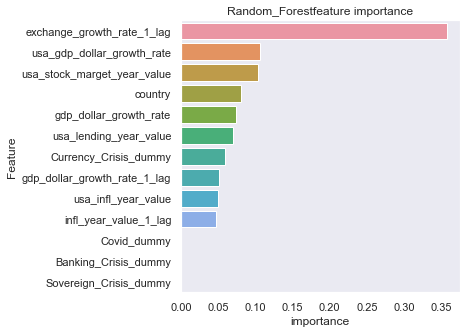

____________________________________________________________


In [18]:
randomforest_hyper_for_exchange(df,exchange,"exchange_growth_rate")

In [19]:
#model test
def load_model_for_exchange():
    """
    country numeric
    Turkey:194
    """
    model = joblib.load('exchange_growth_rate_Random_Forest.joblib')
    X_forecast = pd.DataFrame({
     'usa_gdp_dollar_growth_rate':[5],
     'usa_stock_marget_year_value':[5],
     'usa_lending_year_value':[5],
     'usa_infl_year_value':[5],
     'gdp_dollar_growth_rate_1_lag':[5],
     'gdp_dollar_growth_rate':[5],
     'exchange_growth_rate_1_lag':[5],
     'infl_year_value_1_lag':[5],
     'Currency_Crisis_dummy':[1],
     'Sovereign_Crisis_dummy':[1],
     'Banking_Crisis_dummy':[1],
     'Covid_dummy':[1],
     'country':[194]})
    X_forecast['country'] = X_forecast['country'].astype('category')
    return model.predict(X_forecast)
load_model_for_exchange()

array([27.40039906])

# GDP Dollar Growth Rate Model

100%|███████████████████████████████████████████████| 10/10 [21:29<00:00, 128.90s/trial, best loss: 4.9565439596965986]
0:	learn: 5.7211713	test: 5.3809658	best: 5.3809658 (0)	total: 1.3s	remaining: 12m 53s
Stopped by overfitting detector  (150 iterations wait)

bestTest = 4.95654396
bestIteration = 33

Shrink model to first 34 iterations.
Kaydedilen Model ismi: ['gdp_dollar_growth_rate_CatBoostRegressor.joblib']
############################################################
Test set evaluation    ----  CatBoostRegressor  -----

MAE: 3.001595115009669
MSE: 24.567327915352628
Explained_variance_score: 0.19956281178489832
RMSE: 4.956543948695767
Test R2 Score: 0.1993105681421704
Test Adjusted R2 0.19397263859645153
 
############################################################
Train set evaluation    ----  CatBoostRegressor  -----

MAE: 2.9585159462867887
MSE: 24.280696683059656
Explained_variance_score: 0.2990015951900088
RMSE: 4.9275446911275855
Train R2 Score: 0.298998502032076
Train Ad

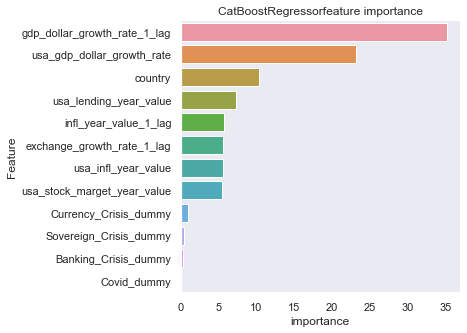

____________________________________________________________


In [20]:
catboost_hyper_for_gdp(df,gdp,"gdp_dollar_growth_rate")

In [21]:
#model test
def load_model_for_gdp():
    """
    country string
    """
    model = joblib.load('gdp_dollar_growth_rate_CatBoostRegressor.joblib')
    X_forecast = pd.DataFrame({'usa_gdp_dollar_growth_rate':[5],
     'usa_stock_marget_year_value':[5],
     'usa_lending_year_value':[5],
     'usa_infl_year_value':[5],
     'gdp_dollar_growth_rate_1_lag':[5],
     'exchange_growth_rate_1_lag':[5],
     'infl_year_value_1_lag':[5],
     'Currency_Crisis_dummy':[1],
     'Sovereign_Crisis_dummy':[1],
     'Banking_Crisis_dummy':[1],
     'Covid_dummy':[1],
     'country':["Turkey"]})
    
    X_forecast['country'] = X_forecast['country'].astype('category')
    
    return model.predict(X_forecast)
load_model_for_gdp()

array([2.72984463])

# Stock Market Year Value Model

Kaydedilen Model ismi: ['stock_marget_year_value_Gradient_Boosting.joblib']
############################################################
Test set evaluation    ----  Gradient_Boosting  -----

MAE: 14.22938713398073
MSE: 351.9532301725982
Explained_variance_score: 0.42205598718264237
RMSE: 18.760416577800136
Test R2 Score: 0.4215075471529528
Test Adjusted R2 0.3985401048562959
 
############################################################
Train set evaluation    ----  Gradient_Boosting  -----

MAE: 11.280178185875638
MSE: 231.41760939755912
Explained_variance_score: 0.6319227742737363
RMSE: 15.212416290568672
Train R2 Score: 0.6319227742737363
Train Adjusted R2 0.6271772177776684


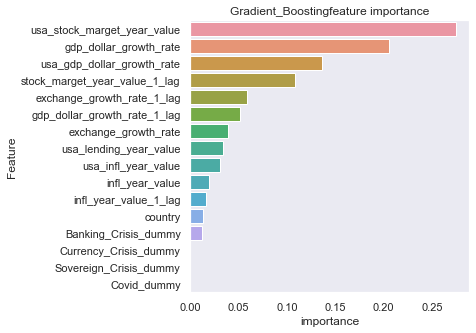

____________________________________________________________


In [22]:
gradientboost_hyper_for_stock(df,stock,"stock_marget_year_value")

In [23]:
def load_model_for_stock():
    """
    country numeric
    Turkey:82
    
    """
    model = joblib.load("stock_marget_year_value_Gradient_Boosting.joblib")
    X_forecast = pd.DataFrame({
     'usa_gdp_dollar_growth_rate':[5],
     'usa_stock_marget_year_value':[5],
     'usa_lending_year_value':[5],
     'usa_infl_year_value':[5],
     'gdp_dollar_growth_rate_1_lag':[5],
     'gdp_dollar_growth_rate':[5],
     'exchange_growth_rate_1_lag':[5],
     'infl_year_value_1_lag':[5],
     'exchange_growth_rate':[5],
     'infl_year_value':[5],
     'stock_marget_year_value_1_lag':[5],
     'Currency_Crisis_dummy':[1],
     'Sovereign_Crisis_dummy':[1], 
     'Banking_Crisis_dummy':[1],
     'Covid_dummy':[1],
     'country':[82]})
    X_forecast['country'] = X_forecast['country'].astype('category')
    return model.predict(X_forecast)
load_model_for_stock()

array([-6.45866863])

# Lending Year Value Model

Kaydedilen Model ismi: ['lending_year_value_LGBM_Regressor.joblib']
############################################################
Test set evaluation    ----  LGBM_Regressor  -----

MAE: 1.1360309371218957
MSE: 3.2551194563316384
Explained_variance_score: 0.8512613393718665
RMSE: 1.804194960732248
Test R2 Score: 0.8508710806554988
Test Adjusted R2 0.8473518141222952
 
############################################################
Train set evaluation    ----  LGBM_Regressor  -----

MAE: 0.5273705223134382
MSE: 0.5856189342490846
Explained_variance_score: 0.9736224140756866
RMSE: 0.765257430051538
Train R2 Score: 0.9736224140381868
Train Adjusted R2 0.9734181345728485


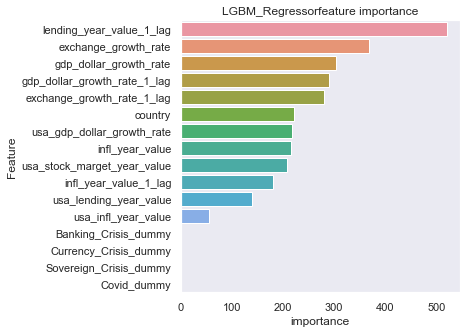

____________________________________________________________


In [24]:
lgbm_hyper_for_lendin(df,lendin,"lending_year_value")

In [25]:
def load_model_for_lendin():
    """
    country numeric
    Ukraine:144
    Turkey lending year values not found source csv!
    """
    model = joblib.load('lending_year_value_LGBM_Regressor.joblib')
    
    X_forecast = pd.DataFrame({
     'usa_gdp_dollar_growth_rate':[5],
     'usa_stock_marget_year_value':[5],
     'usa_lending_year_value':[5],
     'usa_infl_year_value':[5],
     'gdp_dollar_growth_rate_1_lag':[5],
     'gdp_dollar_growth_rate':[5],
     'exchange_growth_rate_1_lag':[5],
     'infl_year_value_1_lag':[5],
     'exchange_growth_rate':[5],
     'infl_year_value':[5],
     'lending_year_value_1_lag':[5],
     'Currency_Crisis_dummy':[1],
     'Sovereign_Crisis_dummy':[1],
     'Banking_Crisis_dummy':[1],
     'Covid_dummy':[1],
     'country':[144]})
    
    X_forecast['country'] = X_forecast['country'].astype('category')
    return model.predict(X_forecast)
load_model_for_lendin()

array([5.53228317])

# İnflation Model

Kaydedilen Model ismi: ['infl_year_value_LGBM_Regression.joblib']
############################################################
Test set evaluation    ----  LGBM_Regression  -----

MAE: 1.7550874231438425
MSE: 6.184508579965678
Explained_variance_score: 0.4091977233760409
RMSE: 2.48686722202165
Test R2 Score: 0.4091826005535515
Test Adjusted R2 0.40279044940034414
 
############################################################
Train set evaluation    ----  LGBM_Regression  -----

MAE: 1.0818316746109624
MSE: 2.239273666574538
Explained_variance_score: 0.7948123466644392
RMSE: 1.496420284069465
Train R2 Score: 0.7948123454940093
Train Adjusted R2 0.7940776582400236


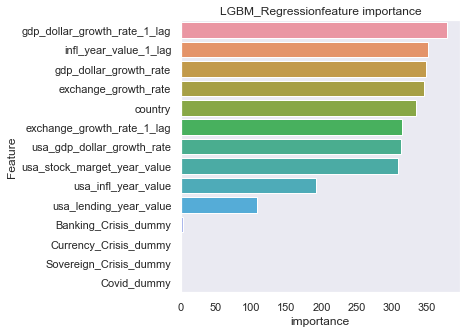

____________________________________________________________


In [26]:
lgbm_hyper_for_inf(df,inf,"infl_year_value")

In [28]:
def load_model_for_inf():
    """
    country numeric
    Turkey:166
    """
    model = joblib.load('infl_year_value_LGBM_Regression.joblib')
    X_forecast = pd.DataFrame({
     'usa_gdp_dollar_growth_rate':[5],
     'usa_stock_marget_year_value':[5],
     'usa_lending_year_value':[5],
     'usa_infl_year_value':[5],
     'gdp_dollar_growth_rate_1_lag':[5],
     'gdp_dollar_growth_rate':[5],
     'exchange_growth_rate_1_lag':[5],
     'infl_year_value_1_lag':[5],
     'exchange_growth_rate':[5],
     'Currency_Crisis_dummy':[1],
     'Sovereign_Crisis_dummy':[1],
     'Banking_Crisis_dummy':[1],
     'Covid_dummy':[1],
     'country':[166]})
    
    X_forecast['country'] = X_forecast['country'].astype('category')
    return model.predict(X_forecast)
load_model_for_inf()

array([6.07260825])